In [1]:
import copy
import numpy as np
from collections import defaultdict
import utils as ut
import memory as mem
import argparse
import sys
import matplotlib
#matplotlib.use("Qt5agg")
#matplotlib.use("TkAgg")
import gym
import gridworld
import torch
from utils import *
from torch.utils.tensorboard import SummaryWriter
from DQNagent import DQNAgent


class RandomAgent(object):
    """The world's simplest agent!"""

    def __init__(self, env, opt):
        self.opt=opt
        self.env=env
        if opt.fromFile is not None:
            self.load(opt.fromFile)
        self.action_space = env.action_space
        self.featureExtractor = opt.featExtractor(env)

    def act(self, observation, reward, done):
        return self.action_space.sample()

    def save(self,outputDir):
        pass

    def load(self,inputDir):
        pass

    
    
class DQNAgent(object):
    """Deep Qlearning"""

    def __init__(self, env, opt, test = False):

        self.opt = opt
        self.env = env
        if opt.fromFile is not None:
            self.load(opt.fromFile)

        self.lossFunc = torch.nn.SmoothL1Loss()
        self.targetStep = 100
        self.batch_size = 100
        self.mem_size = 10000
        self.buffer = mem.Memory(self.mem_size)
        self.test = test
        self.old_state = None
        self.old_act = None
        self.action_space = env.action_space
        self.featureExtractor = opt.featExtractor(env)
        self.Qsa = ut.NN(self.featureExtractor.outSize, env.action_space.n)
        self.QsaTraget = self.Qsa
        self.alpha = 0.1
        self.gamma = 0.99
        self.epsilon0 = 0.2
        self.mu = 0.2

    def act(self, observation, reward, done, time):

        # Qtarget update
        if time % self.targetStep == 0:
            self.setTarget(self.Qsa) 
        
        # Initialisation
        observation = torch.tensor(self.featureExtractor.getFeatures(observation), dtype = torch.float)
        qs = self.Qsa(observation)

        if self.old_state == None:
            
            action = self.env.action_space.sample()
            self.old_state = observation
            self.old_act = action
            
            return action

        # epsilon greedy
        eps = self.epsilon0 / (1 + self.mu * time)
        if np.random.rand() > eps or self.test == True:
            action = torch.argmax(qs)

        else:
            action = self.env.action_space.sample()

        # Remplissage du buffer
        transition = [self.old_state, self.old_act, observation, reward, done]
        self.buffer.store(transition)

        # Apprentissage
        if self.buffer.mem_ptr == self.buffer.mem_size:
            samples = self.buffer.sample(self.batch_size)
            X = torch.tensor([self.Qsa(sample[0])[sample[1]] for sample in samples])
            with torch.no_grad():
                Y = torch.tensor([sample[3] if sample[4] == True else sample[3] + self.gamma * np.max(self.QsaTraget(sample[2])) for sample in samples])

            loss = self.lossFunc(X, Y)
            loss.backward()

        # Update state and action
        self.old_state = observation
        self.old_act = action
            
        return action

    def setTarget(self, target):
        self.QsaTraget = copy.deepcopy(target)
    
    def save(self,outputDir):
        pass
    
    def load(self,inputDir):
        pass

Saving in ./XP/gridworld-v0/random_-1603818297_9341068
tensorboard --logdir=./XP/gridworld-v0/random_-1603818297_9341068
0 rsum=-1, 1 actions 
1 rsum=-2.0010000000000003, 1001 actions 
2 rsum=-1.001, 2 actions 
3 rsum=-2.0010000000000003, 1001 actions 
4 rsum=-2.0010000000000003, 1001 actions 
5 rsum=-2.0010000000000003, 1001 actions 
6 rsum=-2.0010000000000003, 1001 actions 
7 rsum=-2.0010000000000003, 1001 actions 
8 rsum=-2.0010000000000003, 1001 actions 
9 rsum=-2.0010000000000003, 1001 actions 
Test time!


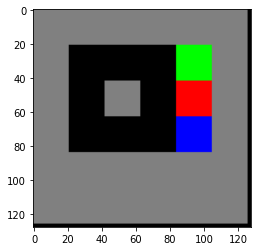

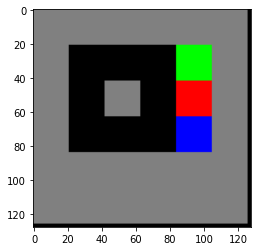

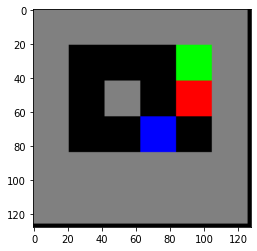

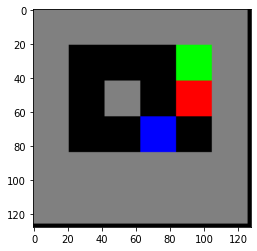

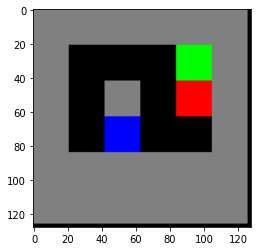

...

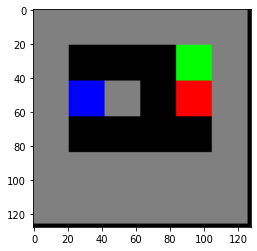

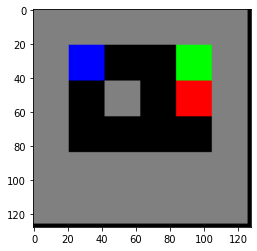

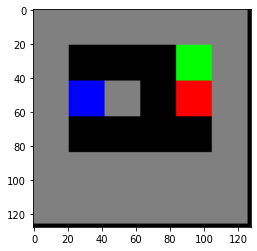

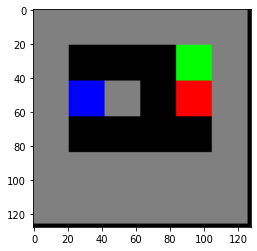

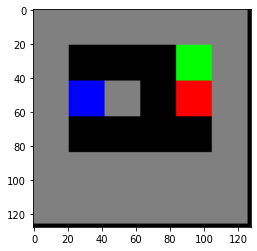

/home/castanet/python3_env/bin


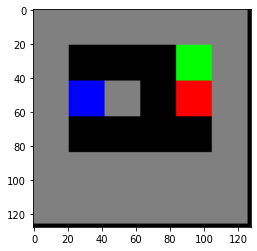

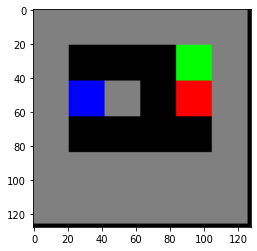

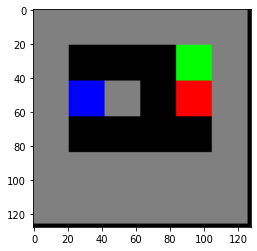

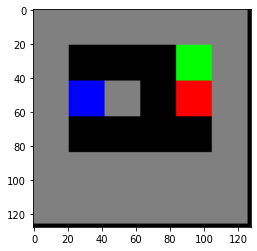

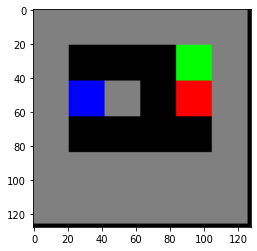

...

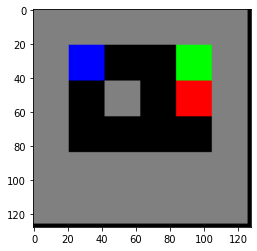

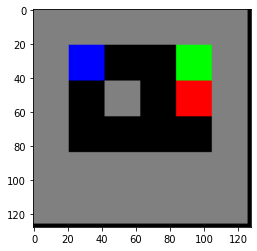

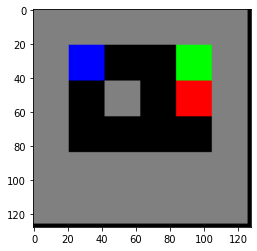

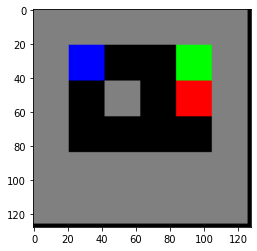

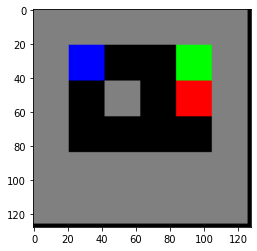

10 rsum=-2.0010000000000003, 1001 actions 
End of test, mean reward= -2.0010000000000003
11 rsum=-1.003, 4 actions 
12 rsum=-2.0010000000000003, 1001 actions 
13 rsum=-2.0010000000000003, 1001 actions 
14 rsum=-2.0010000000000003, 1001 actions 
15 rsum=-2.0010000000000003, 1001 actions 
16 rsum=-1, 1 actions 
17 rsum=-2.0010000000000003, 1001 actions 
18 rsum=-2.0010000000000003, 1001 actions 
19 rsum=-2.0010000000000003, 1001 actions 
Test time!


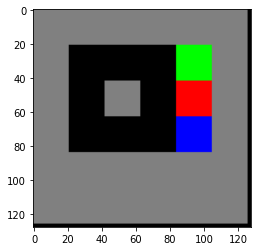

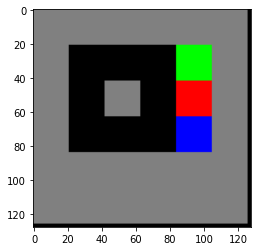

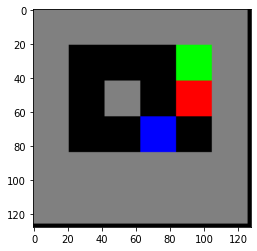

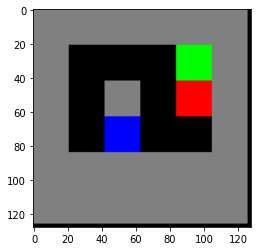

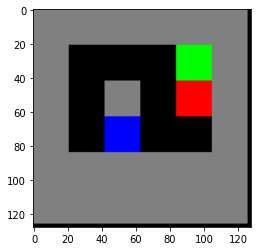

...

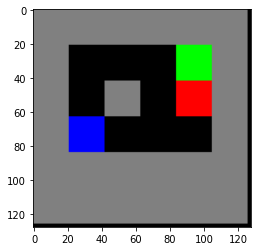

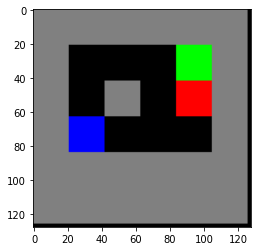

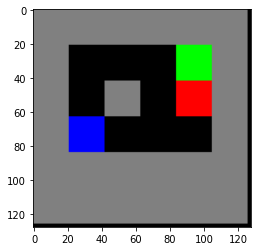

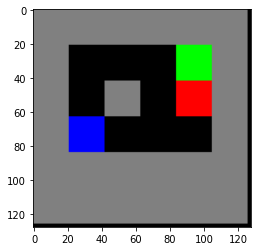

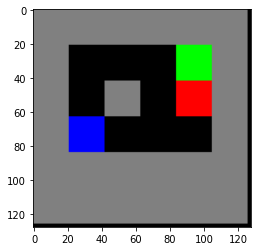

20 rsum=-2.0010000000000003, 1001 actions 
End of test, mean reward= -2.0010000000000003
21 rsum=-2.0010000000000003, 1001 actions 
22 rsum=-2.0010000000000003, 1001 actions 
23 rsum=-2.0010000000000003, 1001 actions 
24 rsum=-2.0010000000000003, 1001 actions 
25 rsum=-2.0010000000000003, 1001 actions 
26 rsum=-2.0010000000000003, 1001 actions 
27 rsum=-2.0010000000000003, 1001 actions 
28 rsum=-2.0010000000000003, 1001 actions 
29 rsum=-2.0010000000000003, 1001 actions 
Test time!


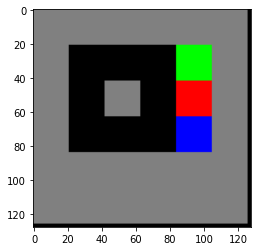

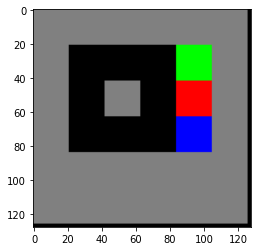

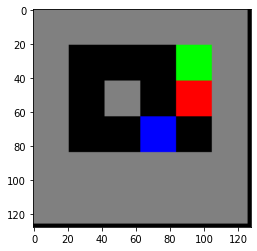

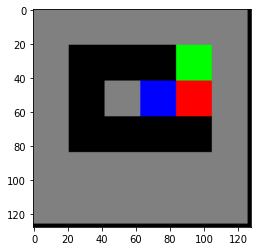

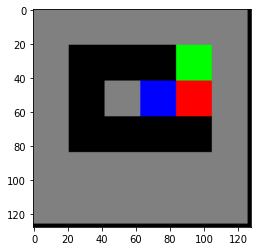

...

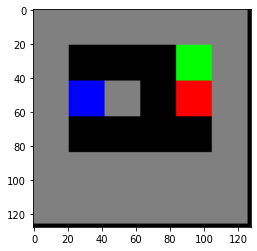

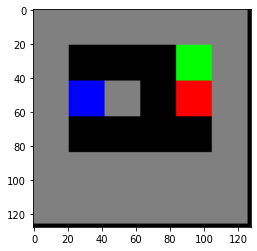

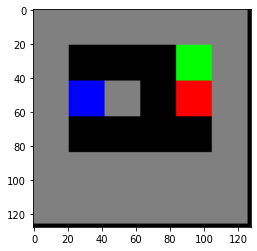

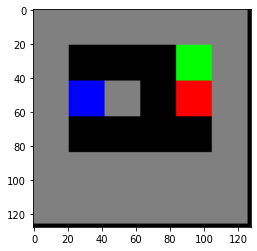

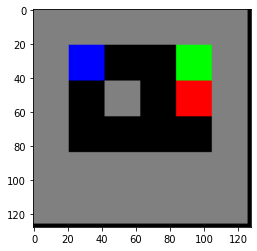

KeyboardInterrupt: 

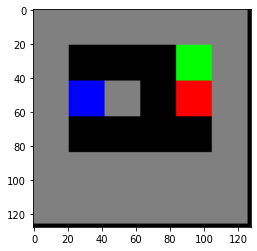

In [2]:
config = load_yaml('./configs/config_random_gridworld.yaml')
#config = load_yaml('./configs/config_random_cartpole.yaml')
#config = load_yaml('./configs/config_random_lunar.yaml')

freqTest = config["freqTest"]
freqSave = config["freqSave"]
nbTest = config["nbTest"]

env = gym.make(config["env"])
if hasattr(env, 'setPlan'):
    env.setPlan(config["map"], config["rewards"])

tstart = str(time.time())
tstart = tstart.replace(".", "_")
outdir = "./XP/" + config["env"] + "/random_" + "-" + tstart


env.seed(config["seed"])
np.random.seed(config["seed"])
torch.manual_seed(config["seed"])

episode_count = config["nbEpisodes"]
ob = env.reset()

agent = DQNAgent(env,config)

print("Saving in " + outdir)
os.makedirs(outdir, exist_ok=True)
save_src(os.path.abspath(outdir))
write_yaml(os.path.join(outdir, 'info.yaml'), config)
logger = LogMe(SummaryWriter(outdir))
loadTensorBoard(outdir)

rsum = 0
mean = 0
verbose = True
itest = 0
reward = 0
done = False
for i in range(episode_count):
    if i % int(config["freqVerbose"]) == 0 and i >= config["freqVerbose"]:
        verbose = True
    else:
        verbose = False

    if i % freqTest == 0 and i >= freqTest:  ##### Same as train for now
        print("Test time!")
        mean = 0
        agent.test = True

    if i % freqTest == nbTest and i > freqTest:
        print("End of test, mean reward=", mean / nbTest)
        itest += 1
        logger.direct_write("rewardTest", mean / nbTest, itest)
        agent.test = False

    if i % freqSave == 0:
        agent.save(outdir + "/save_" + str(i))

    j = 0
    if verbose:
        env.render()

    while True:
        if verbose:
            env.render()

        action = agent.act(ob, reward, done, j)
        ob, reward, done, _ = env.step(action)
        j+=1

        rsum += reward
        if done:
            print(str(i) + " rsum=" + str(rsum) + ", " + str(j) + " actions ")
            logger.direct_write("reward", rsum, i)
            agent.nbEvents = 0
            mean += rsum
            rsum = 0
            ob = env.reset()
            break

env.close()